## 1. Import Required Libraries

In [11]:
import os
import xml.etree.ElementTree as ET
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter, defaultdict
import cv2
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (15, 8)

print("All libraries imported successfully!")

All libraries imported successfully!


## 2. Setup Data Paths and Parse VOC Dataset

In [12]:
# Define paths
data_dir = Path('./data')
train_val_dir = data_dir / 'VOC2012_train_val' / 'VOC2012_train_val'
test_dir = data_dir / 'VOC2012_test' / 'VOC2012_test'

# Check if directories exist
print(f"Train/Val directory exists: {train_val_dir.exists()}")
print(f"Test directory exists: {test_dir.exists()}")

# Define paths for different components
train_val_annotations = train_val_dir / 'Annotations'
train_val_images = train_val_dir / 'JPEGImages'
test_annotations = test_dir / 'Annotations'
test_images = test_dir / 'JPEGImages'

print(f"\nTrain/Val Annotations: {len(list(train_val_annotations.glob('*.xml')))} files")
print(f"Train/Val Images: {len(list(train_val_images.glob('*.jpg')))} files")
print(f"Test Annotations: {len(list(test_annotations.glob('*.xml')))} files")
print(f"Test Images: {len(list(test_images.glob('*.jpg')))} files")

Train/Val directory exists: True
Test directory exists: True

Train/Val Annotations: 17125 files
Train/Val Images: 17125 files
Test Annotations: 5138 files
Test Images: 16135 files


In [17]:
def parse_voc_annotation(xml_file):
    """
    Parse a single VOC XML annotation file
    Returns: dict with image info and bounding boxes
    """
    tree = ET.parse(xml_file)
    root = tree.getroot()
    
    # Get image info
    filename = root.find('filename').text
    size = root.find('size')
    width = int(size.find('width').text)
    height = int(size.find('height').text)
    depth = int(size.find('depth').text)
    
    # Get all objects
    objects = []
    for obj in root.findall('object'):
        name = obj.find('name').text
        difficult = int(obj.find('difficult').text) if obj.find('difficult') is not None else 0
        bbox = obj.find('bndbox')
        
        # Handle both integer and float coordinates
        xmin = int(float(bbox.find('xmin').text))
        ymin = int(float(bbox.find('ymin').text))
        xmax = int(float(bbox.find('xmax').text))
        ymax = int(float(bbox.find('ymax').text))
        
        objects.append({
            'class': name,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax,
            'difficult': difficult
        })
    
    return {
        'filename': filename,
        'width': width,
        'height': height,
        'depth': depth,
        'objects': objects
    }

# Test parsing
sample_xml = list(train_val_annotations.glob('*.xml'))[0]
sample_data = parse_voc_annotation(sample_xml)
print("Sample annotation:")
print(f"Filename: {sample_data['filename']}")
print(f"Image size: {sample_data['width']}x{sample_data['height']}")
print(f"Number of objects: {len(sample_data['objects'])}")
print(f"Objects: {[obj['class'] for obj in sample_data['objects']]}")

Sample annotation:
Filename: 2007_000027.jpg
Image size: 486x500
Number of objects: 1
Objects: ['person']


## 3. Comprehensive EDA: Class Distribution Analysis

In [18]:
# Parse all annotations from train/val set
print("Parsing all train/val annotations...")
all_data = []
class_counts = Counter()
image_class_counts = defaultdict(set)
bbox_sizes = []
aspect_ratios = []

for xml_file in train_val_annotations.glob('*.xml'):
    data = parse_voc_annotation(xml_file)
    all_data.append(data)
    
    for obj in data['objects']:
        class_name = obj['class']
        class_counts[class_name] += 1
        image_class_counts[class_name].add(data['filename'])
        
        # Calculate bbox statistics
        bbox_width = obj['xmax'] - obj['xmin']
        bbox_height = obj['ymax'] - obj['ymin']
        bbox_area = bbox_width * bbox_height
        bbox_sizes.append(bbox_area)
        
        if bbox_height > 0:
            aspect_ratios.append(bbox_width / bbox_height)

print(f"Total images parsed: {len(all_data)}")
print(f"Total classes found: {len(class_counts)}")
print(f"Total object instances: {sum(class_counts.values())}")
print(f"\nAll classes: {sorted(class_counts.keys())}")

Parsing all train/val annotations...
Total images parsed: 17125
Total classes found: 20
Total object instances: 40138

All classes: ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


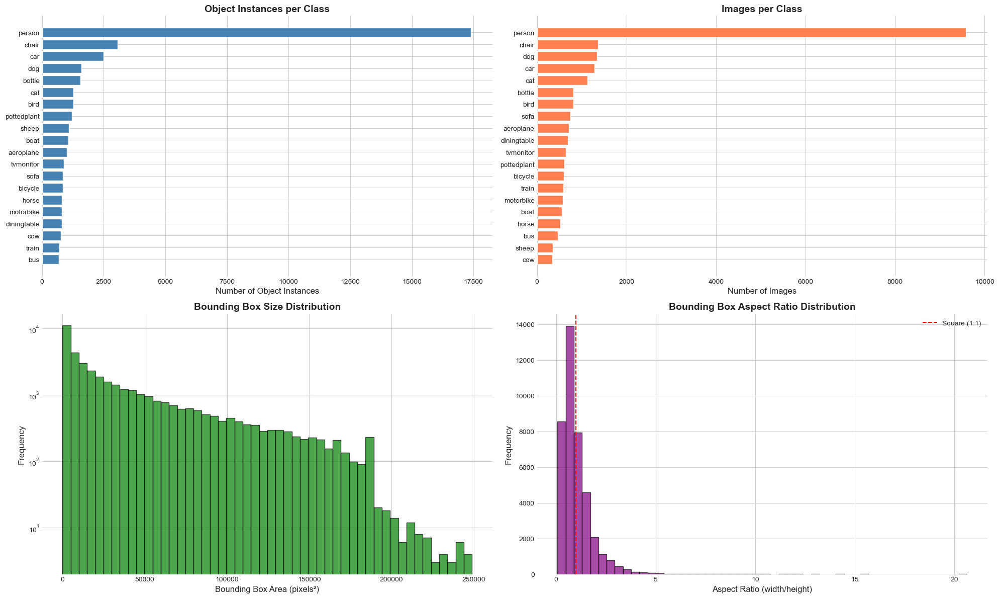


Top 10 classes by object count:
          Class  Count
0        person  17401
6         chair   3056
16          car   2492
5           dog   1598
9        bottle   1561
17          cat   1277
7          bird   1271
19  pottedplant   1202
10        sheep   1084
4          boat   1059


In [19]:
# Visualize class distribution
fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# 1. Object instances per class
class_df = pd.DataFrame(list(class_counts.items()), columns=['Class', 'Count'])
class_df = class_df.sort_values('Count', ascending=False)

axes[0, 0].barh(class_df['Class'], class_df['Count'], color='steelblue')
axes[0, 0].set_xlabel('Number of Object Instances', fontsize=12)
axes[0, 0].set_title('Object Instances per Class', fontsize=14, fontweight='bold')
axes[0, 0].invert_yaxis()

# 2. Number of images per class
image_counts = {cls: len(imgs) for cls, imgs in image_class_counts.items()}
image_df = pd.DataFrame(list(image_counts.items()), columns=['Class', 'Images'])
image_df = image_df.sort_values('Images', ascending=False)

axes[0, 1].barh(image_df['Class'], image_df['Images'], color='coral')
axes[0, 1].set_xlabel('Number of Images', fontsize=12)
axes[0, 1].set_title('Images per Class', fontsize=14, fontweight='bold')
axes[0, 1].invert_yaxis()

# 3. Bounding box size distribution
axes[1, 0].hist(bbox_sizes, bins=50, color='green', alpha=0.7, edgecolor='black')
axes[1, 0].set_xlabel('Bounding Box Area (pixels²)', fontsize=12)
axes[1, 0].set_ylabel('Frequency', fontsize=12)
axes[1, 0].set_title('Bounding Box Size Distribution', fontsize=14, fontweight='bold')
axes[1, 0].set_yscale('log')

# 4. Aspect ratio distribution
axes[1, 1].hist(aspect_ratios, bins=50, color='purple', alpha=0.7, edgecolor='black')
axes[1, 1].set_xlabel('Aspect Ratio (width/height)', fontsize=12)
axes[1, 1].set_ylabel('Frequency', fontsize=12)
axes[1, 1].set_title('Bounding Box Aspect Ratio Distribution', fontsize=14, fontweight='bold')
axes[1, 1].axvline(1.0, color='red', linestyle='--', label='Square (1:1)')
axes[1, 1].legend()

plt.tight_layout()
plt.show()

# Print top 10 classes
print("\nTop 10 classes by object count:")
print(class_df.head(10))

## 4. Select 5 Classes for Training

We'll select 5 classes based on:
- Sufficient number of samples
- Diverse object types (vehicles, animals, people, etc.)
- Good representation across different sizes

In [20]:
# Select 5 diverse classes with good sample counts
# Choosing: person, car, dog, cat, aeroplane (diverse categories with good samples)
SELECTED_CLASSES = ['person', 'car', 'dog', 'cat', 'aeroplane']

print("Selected 5 classes for training:")
for i, cls in enumerate(SELECTED_CLASSES, 1):
    instances = class_counts[cls]
    images = len(image_class_counts[cls])
    print(f"{i}. {cls:15s} - {instances:4d} instances in {images:4d} images")

# Create mapping from class name to index (0 is background)
class_to_idx = {cls: idx + 1 for idx, cls in enumerate(SELECTED_CLASSES)}
idx_to_class = {idx: cls for cls, idx in class_to_idx.items()}
idx_to_class[0] = 'background'

print(f"\nClass to index mapping:")
print(class_to_idx)

# Save class mapping
import json
with open('./data/class_mapping.json', 'w') as f:
    json.dump({
        'class_to_idx': class_to_idx,
        'idx_to_class': {str(k): v for k, v in idx_to_class.items()},
        'selected_classes': SELECTED_CLASSES
    }, f, indent=2)
print("\nClass mapping saved to './data/class_mapping.json'")

Selected 5 classes for training:
1. person          - 17401 instances in 9583 images
2. car             - 2492 instances in 1284 images
3. dog             - 1598 instances in 1341 images
4. cat             - 1277 instances in 1128 images
5. aeroplane       - 1002 instances in  716 images

Class to index mapping:
{'person': 1, 'car': 2, 'dog': 3, 'cat': 4, 'aeroplane': 5}

Class mapping saved to './data/class_mapping.json'


## 5. Filter Dataset for Selected Classes

In [21]:
# Filter annotations to only include selected classes
filtered_data = []

for data in all_data:
    # Filter objects to only selected classes
    filtered_objects = [obj for obj in data['objects'] if obj['class'] in SELECTED_CLASSES]
    
    # Only keep images that have at least one object from selected classes
    if filtered_objects:
        filtered_data.append({
            'filename': data['filename'],
            'width': data['width'],
            'height': data['height'],
            'depth': data['depth'],
            'objects': filtered_objects
        })

print(f"Total images after filtering: {len(filtered_data)}")
print(f"Total object instances: {sum(len(d['objects']) for d in filtered_data)}")

# Calculate statistics for filtered data
filtered_class_counts = Counter()
for data in filtered_data:
    for obj in data['objects']:
        filtered_class_counts[obj['class']] += 1

print("\nFiltered class distribution:")
for cls in SELECTED_CLASSES:
    print(f"{cls:15s}: {filtered_class_counts[cls]:4d} instances")

Total images after filtering: 12885
Total object instances: 23770

Filtered class distribution:
person         : 17401 instances
car            : 2492 instances
dog            : 1598 instances
cat            : 1277 instances
aeroplane      : 1002 instances


## 6. Visualize Sample Images with Annotations

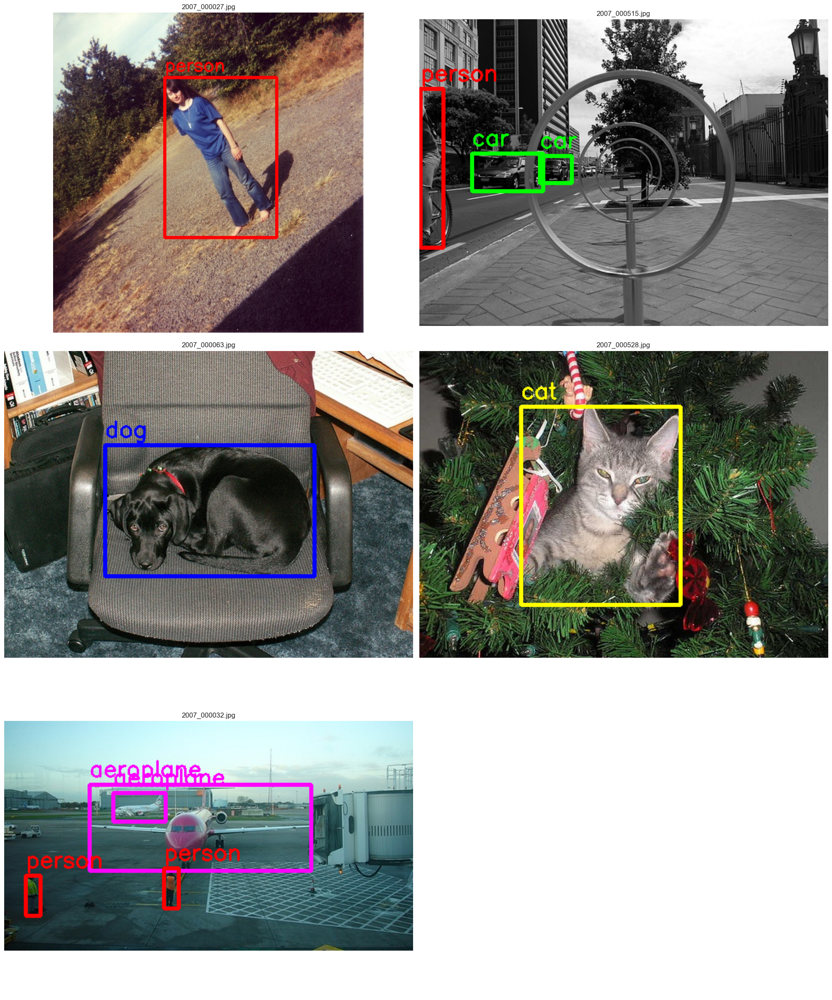

In [22]:
def visualize_sample(data, img_dir, ax=None):
    """Visualize a single image with bounding boxes"""
    img_path = img_dir / data['filename']
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Define colors for each class
    colors = {
        'person': (255, 0, 0),
        'car': (0, 255, 0),
        'dog': (0, 0, 255),
        'cat': (255, 255, 0),
        'aeroplane': (255, 0, 255)
    }
    
    # Draw bounding boxes
    for obj in data['objects']:
        cls = obj['class']
        color = colors.get(cls, (128, 128, 128))
        
        cv2.rectangle(img, 
                     (obj['xmin'], obj['ymin']),
                     (obj['xmax'], obj['ymax']),
                     color, 3)
        
        # Add label
        label = cls
        cv2.putText(img, label, 
                   (obj['xmin'], obj['ymin'] - 10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)
    
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f"{data['filename']}", fontsize=12)
    
    return img

# Visualize samples from each class
fig, axes = plt.subplots(3, 2, figsize=(20, 24))
axes = axes.flatten()

samples_per_class = {}
for data in filtered_data:
    for obj in data['objects']:
        cls = obj['class']
        if cls not in samples_per_class:
            samples_per_class[cls] = data

for idx, cls in enumerate(SELECTED_CLASSES):
    if cls in samples_per_class:
        visualize_sample(samples_per_class[cls], train_val_images, axes[idx])

# Hide last subplot if odd number
if len(SELECTED_CLASSES) < 6:
    axes[-1].axis('off')

plt.tight_layout()
plt.show()

## 7. Analyze Image and Object Size Statistics

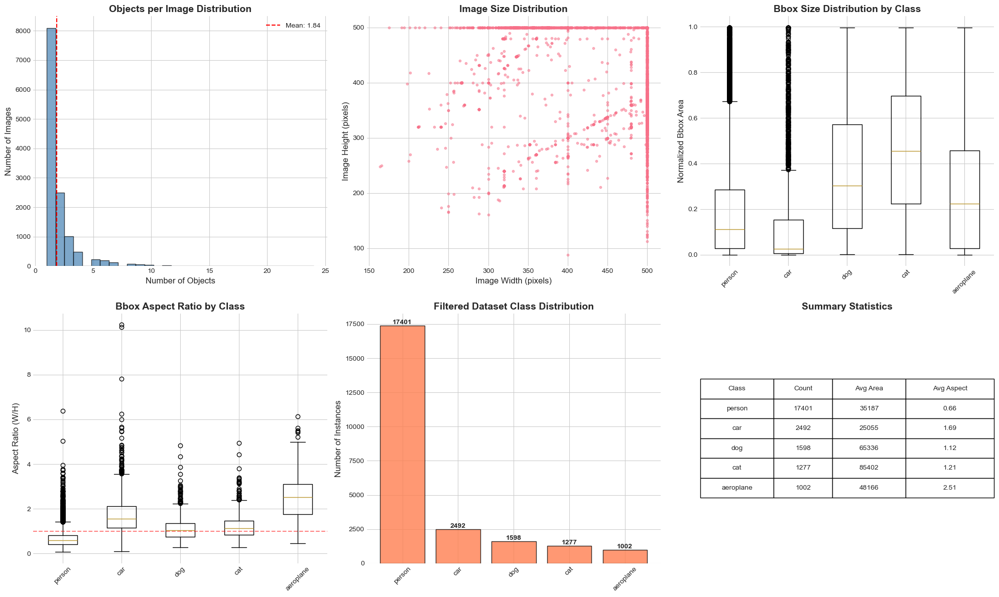


Dataset Statistics Summary:
Total images: 12885
Total objects: 23770
Average objects per image: 1.84
Most common image size: ((500, 375), 5316)


In [23]:
# Analyze image sizes and object statistics
image_sizes = []
objects_per_image = []
class_wise_bbox_stats = defaultdict(list)

for data in filtered_data:
    image_sizes.append((data['width'], data['height']))
    objects_per_image.append(len(data['objects']))
    
    for obj in data['objects']:
        bbox_width = obj['xmax'] - obj['xmin']
        bbox_height = obj['ymax'] - obj['ymin']
        bbox_area = bbox_width * bbox_height
        
        # Normalized bbox size (relative to image size)
        norm_area = bbox_area / (data['width'] * data['height'])
        class_wise_bbox_stats[obj['class']].append({
            'area': bbox_area,
            'norm_area': norm_area,
            'width': bbox_width,
            'height': bbox_height,
            'aspect_ratio': bbox_width / bbox_height if bbox_height > 0 else 0
        })

# Visualization
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# 1. Objects per image distribution
axes[0, 0].hist(objects_per_image, bins=30, color='steelblue', alpha=0.7, edgecolor='black')
axes[0, 0].set_xlabel('Number of Objects', fontsize=12)
axes[0, 0].set_ylabel('Number of Images', fontsize=12)
axes[0, 0].set_title('Objects per Image Distribution', fontsize=14, fontweight='bold')
axes[0, 0].axvline(np.mean(objects_per_image), color='red', linestyle='--', 
                   label=f'Mean: {np.mean(objects_per_image):.2f}')
axes[0, 0].legend()

# 2. Image size distribution
widths = [size[0] for size in image_sizes]
heights = [size[1] for size in image_sizes]
axes[0, 1].scatter(widths, heights, alpha=0.5, s=10)
axes[0, 1].set_xlabel('Image Width (pixels)', fontsize=12)
axes[0, 1].set_ylabel('Image Height (pixels)', fontsize=12)
axes[0, 1].set_title('Image Size Distribution', fontsize=14, fontweight='bold')

# 3. Class-wise normalized bbox area
class_norm_areas = {cls: [s['norm_area'] for s in stats] 
                    for cls, stats in class_wise_bbox_stats.items()}
axes[0, 2].boxplot([class_norm_areas[cls] for cls in SELECTED_CLASSES],
                   labels=SELECTED_CLASSES)
axes[0, 2].set_ylabel('Normalized Bbox Area', fontsize=12)
axes[0, 2].set_title('Bbox Size Distribution by Class', fontsize=14, fontweight='bold')
axes[0, 2].tick_params(axis='x', rotation=45)

# 4. Class-wise aspect ratio
class_aspects = {cls: [s['aspect_ratio'] for s in stats] 
                 for cls, stats in class_wise_bbox_stats.items()}
axes[1, 0].boxplot([class_aspects[cls] for cls in SELECTED_CLASSES],
                   labels=SELECTED_CLASSES)
axes[1, 0].set_ylabel('Aspect Ratio (W/H)', fontsize=12)
axes[1, 0].set_title('Bbox Aspect Ratio by Class', fontsize=14, fontweight='bold')
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].axhline(1.0, color='red', linestyle='--', alpha=0.5)

# 5. Objects per class (filtered dataset)
axes[1, 1].bar(SELECTED_CLASSES, [filtered_class_counts[cls] for cls in SELECTED_CLASSES],
              color='coral', alpha=0.8, edgecolor='black')
axes[1, 1].set_ylabel('Number of Instances', fontsize=12)
axes[1, 1].set_title('Filtered Dataset Class Distribution', fontsize=14, fontweight='bold')
axes[1, 1].tick_params(axis='x', rotation=45)
for i, cls in enumerate(SELECTED_CLASSES):
    axes[1, 1].text(i, filtered_class_counts[cls], str(filtered_class_counts[cls]),
                   ha='center', va='bottom', fontweight='bold')

# 6. Statistics summary table
stats_data = []
for cls in SELECTED_CLASSES:
    stats = class_wise_bbox_stats[cls]
    stats_data.append([
        cls,
        filtered_class_counts[cls],
        f"{np.mean([s['area'] for s in stats]):.0f}",
        f"{np.mean([s['aspect_ratio'] for s in stats]):.2f}"
    ])

axes[1, 2].axis('tight')
axes[1, 2].axis('off')
table = axes[1, 2].table(cellText=stats_data,
                         colLabels=['Class', 'Count', 'Avg Area', 'Avg Aspect'],
                         cellLoc='center',
                         loc='center',
                         colWidths=[0.25, 0.2, 0.25, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 2)
axes[1, 2].set_title('Summary Statistics', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

print("\nDataset Statistics Summary:")
print(f"Total images: {len(filtered_data)}")
print(f"Total objects: {sum(filtered_class_counts.values())}")
print(f"Average objects per image: {np.mean(objects_per_image):.2f}")
print(f"Most common image size: {Counter(image_sizes).most_common(1)[0]}")

## 8. Create Train/Validation Split

In [25]:
# Split data into train and validation sets (80-20 split)
from sklearn.model_selection import train_test_split

# Ensure reproducibility
np.random.seed(42)

# Split filenames
train_data, val_data = train_test_split(filtered_data, test_size=0.2, random_state=42)

print(f"Training set: {len(train_data)} images")
print(f"Validation set: {len(val_data)} images")

# Calculate class distribution in train and val sets
train_class_counts = Counter()
val_class_counts = Counter()

for data in train_data:
    for obj in data['objects']:
        train_class_counts[obj['class']] += 1

for data in val_data:
    for obj in data['objects']:
        val_class_counts[obj['class']] += 1

print("\nTrain set class distribution:")
for cls in SELECTED_CLASSES:
    print(f"{cls:15s}: {train_class_counts[cls]:4d} instances")

print("\nValidation set class distribution:")
for cls in SELECTED_CLASSES:
    print(f"{cls:15s}: {val_class_counts[cls]:4d} instances")

# Save splits
import pickle

with open('./data/train_data.pkl', 'wb') as f:
    pickle.dump(train_data, f)

with open('./data/val_data.pkl', 'wb') as f:
    pickle.dump(val_data, f)

print("\nTrain and validation splits saved!")

Training set: 10308 images
Validation set: 2577 images

Train set class distribution:
person         : 14014 instances
car            : 2017 instances
dog            : 1273 instances
cat            :  978 instances
aeroplane      :  791 instances

Validation set class distribution:
person         : 3387 instances
car            :  475 instances
dog            :  325 instances
cat            :  299 instances
aeroplane      :  211 instances

Train and validation splits saved!


## 9. Data Augmentation Visualization

Visualize various augmentation techniques that will be used during training

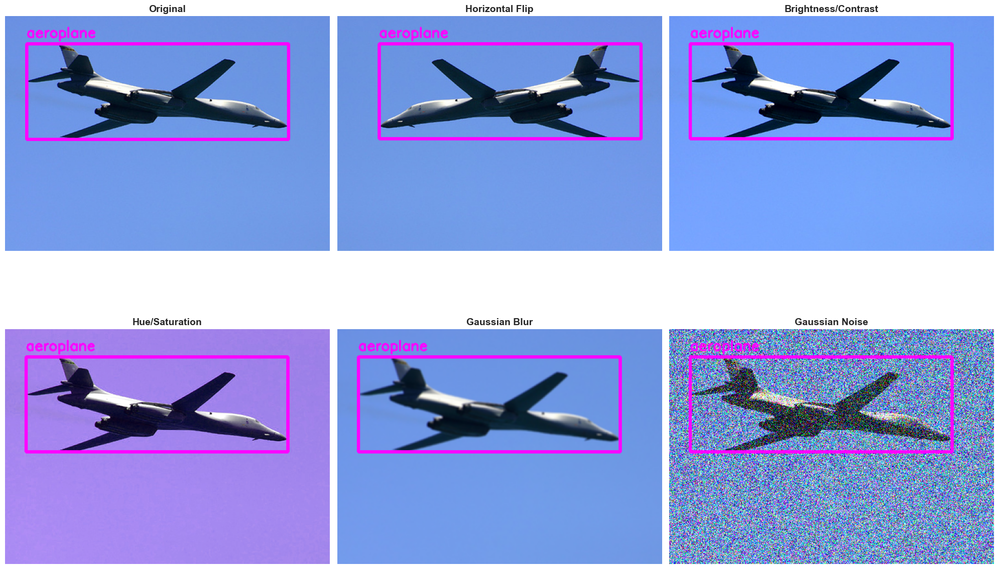

Augmentation techniques that will be used during training:
1. Horizontal Flip
2. Random Brightness & Contrast adjustment
3. Hue, Saturation & Value adjustment
4. Random Gamma correction
5. Gaussian Blur
6. Gaussian Noise
7. Resize to 416x416


In [26]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Define augmentation pipeline
def get_augmentation_transforms(is_train=True):
    """Get augmentation transforms for training"""
    if is_train:
        return A.Compose([
            A.HorizontalFlip(p=0.5),
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
            A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
            A.RandomGamma(gamma_limit=(80, 120), p=0.3),
            A.GaussianBlur(blur_limit=(3, 5), p=0.3),
            A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
            A.Resize(416, 416),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))
    else:
        return A.Compose([
            A.Resize(416, 416),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

# Visualize augmentations
sample_data = train_data[0]
img_path = train_val_images / sample_data['filename']
img = cv2.imread(str(img_path))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Extract bboxes and labels
bboxes = [[obj['xmin'], obj['ymin'], obj['xmax'], obj['ymax']] for obj in sample_data['objects']]
labels = [obj['class'] for obj in sample_data['objects']]

# Define augmentations to visualize
augmentations = {
    'Original': None,
    'Horizontal Flip': A.HorizontalFlip(p=1.0),
    'Brightness/Contrast': A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1.0),
    'Hue/Saturation': A.HueSaturationValue(hue_shift_limit=30, sat_shift_limit=40, val_shift_limit=30, p=1.0),
    'Gaussian Blur': A.GaussianBlur(blur_limit=(5, 7), p=1.0),
    'Gaussian Noise': A.GaussNoise(var_limit=(30.0, 70.0), p=1.0),
}

fig, axes = plt.subplots(2, 3, figsize=(20, 14))
axes = axes.flatten()

colors = {
    'person': (255, 0, 0),
    'car': (0, 255, 0),
    'dog': (0, 0, 255),
    'cat': (255, 255, 0),
    'aeroplane': (255, 0, 255)
}

for idx, (name, aug) in enumerate(augmentations.items()):
    if aug is None:
        # Original image
        img_aug = img.copy()
        bboxes_aug = bboxes.copy()
        labels_aug = labels.copy()
    else:
        # Apply augmentation
        transform = A.Compose([aug], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))
        transformed = transform(image=img, bboxes=bboxes, labels=labels)
        img_aug = transformed['image']
        bboxes_aug = transformed['bboxes']
        labels_aug = transformed['labels']
    
    # Draw bboxes
    img_display = img_aug.copy()
    for bbox, label in zip(bboxes_aug, labels_aug):
        xmin, ymin, xmax, ymax = map(int, bbox)
        color = colors.get(label, (128, 128, 128))
        cv2.rectangle(img_display, (xmin, ymin), (xmax, ymax), color, 3)
        cv2.putText(img_display, label, (xmin, ymin - 10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
    
    axes[idx].imshow(img_display)
    axes[idx].set_title(name, fontsize=14, fontweight='bold')
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

print("Augmentation techniques that will be used during training:")
print("1. Horizontal Flip")
print("2. Random Brightness & Contrast adjustment")
print("3. Hue, Saturation & Value adjustment")
print("4. Random Gamma correction")
print("5. Gaussian Blur")
print("6. Gaussian Noise")
print("7. Resize to 416x416")

## 10. Summary and Next Steps

### Dataset Summary:
- **Selected Classes**: person, car, dog, cat, aeroplane
- **Total Images**: Filtered from VOC2012 dataset
- **Train/Val Split**: 80/20
- **Image Size**: Variable (will be resized to 416x416)
- **Augmentation**: Multiple techniques including flips, color adjustments, blur, and noise

### Next Steps:
1. Implement PyTorch Dataset and DataLoader
2. Build multiple object detection architectures:
   - Simple CNN-based detector (fast, less accurate)
   - Medium complexity detector (balanced)
   - Complex Faster R-CNN style detector (slower, more accurate)
3. Train models with different configurations
4. Evaluate using mAP, FPS, and model size
5. Compare trade-offs between speed and accuracy

**Proceed to task1.ipynb for model training**